In [ ]:
# kaggle_unlearning_demo.py
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms

# ----- 1. Toy dataset -----
transform = transforms.Compose([transforms.ToTensor()])
train_data = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
forget_idx = list(range(1000, 2000))   # synthetic forget set
retain_idx = [i for i in range(len(train_data)) if i not in forget_idx]

forget_loader = torch.utils.data.DataLoader(torch.utils.data.Subset(train_data, forget_idx), batch_size=64)
retain_loader = torch.utils.data.DataLoader(torch.utils.data.Subset(train_data, retain_idx), batch_size=64)

# ----- 2. Base encoder -----
class Encoder(nn.Module):
    def __init__(self, d=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(28*28, 512), nn.ReLU(),
            nn.Linear(512, d)
        )
    def forward(self, x): return self.net(x)

# ----- 3. Low-rank projector -----
class LowRankProjector(nn.Module):
    def __init__(self, d=128, r=20):
        super().__init__()
        self.U = nn.Parameter(torch.randn(d, r))
        self.V = nn.Parameter(torch.randn(r, d))
    def forward(self, z): return z @ (self.U @ self.V)

# ----- 4. Combined model -----
enc = Encoder()
proj = LowRankProjector()
device = "cuda" if torch.cuda.is_available() else "cpu"
enc, proj = enc.to(device), proj.to(device)

opt = optim.Adam(list(enc.parameters())+list(proj.parameters()), lr=1e-3)
criterion = nn.CrossEntropyLoss()

clf = nn.Linear(128, 10).to(device)

# ----- 5. Training with forgetting -----
for epoch in range(10):
    for x,y in retain_loader:
        x,y = x.to(device), y.to(device)
        opt.zero_grad()
        z = proj(enc(x))
        out = clf(z)
        loss = criterion(out,y)
        loss.backward()
        opt.step()

# ----- 6. Auditing: Membership Inference (simple) -----
def audit(loader):
    enc.eval(); proj.eval(); clf.eval()
    correct, total = 0,0
    with torch.no_grad():
        for x,y in loader:
            x,y = x.to(device), y.to(device)
            out = clf(proj(enc(x)))
            pred = out.argmax(1)
            correct += (pred==y).sum().item(); total+=y.size(0)
    return correct/total

print("Retain acc:", audit(retain_loader))
print("Forget acc:", audit(forget_loader))

100%|██████████| 9.91M/9.91M [00:01<00:00, 4.96MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 129kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.25MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 13.4MB/s]


Retain acc: 0.9878305084745763
Forget acc: 0.959


# COMPSCI 764 - Research GAP




In [ ]:
!pip -q install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip -q install transformers==4.44.2 sentence-transformers==3.0.1 diffusers==0.30.0 accelerate==0.34.2 safetensors==0.4.4 pillow==10.4.0 scipy==1.14.1 open_clip_torch==2.24.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 979.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 47.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.9/434.9 kB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.5 MB/s eta 0:00:00


Colab cell 2 — RA-LCN core + utilities

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import Tensor
import numpy as np

# ---------------------------
# Utils
# ---------------------------

def _to_device(x, device):
    if isinstance(x, torch.Tensor):
        return x.to(device)
    return torch.tensor(x, device=device)

def stable_inverse(mat: Tensor, eps: float = 1e-5) -> Tensor:
    # (A^T M A)^{-1} with Tikhonov ridge for numerical stability
    k = mat.shape[-1]
    return torch.linalg.inv(mat + eps * torch.eye(k, device=mat.device, dtype=mat.dtype))

def center(X: Tensor) -> Tensor:
    return X - X.mean(dim=0, keepdim=True)

def cov(X: Tensor) -> Tensor:
    # Sample covariance (unbiased=False); X: n x d
    Xc = center(X)
    n = Xc.shape[0]
    return (Xc.T @ Xc) / max(n, 1)

def orthonormalize(U: Tensor, eps: float = 1e-6) -> Tensor:
    # Gram-Schmidt via QR (more stable)
    # U: d x k
    Q, R = torch.linalg.qr(U, mode='reduced')
    # remove nearly-zero columns (rank deficiency)
    diag = torch.abs(torch.diag(R))
    keep = diag > eps
    return Q[:, keep]

# ---------------------------
# RA-LCN Projector
# ---------------------------

class RAProjector(nn.Module):
    """
    P = I - U (U^T M U)^{-1} U^T M
    where:
      - U: d x k basis (forget subspace)
      - M: d x d symmetric PD metric (retain-aware). Common choice: M = Sigma_r^{-1}
    """
    def __init__(self, U: Tensor, M: Tensor = None, metric: str = "identity", retain_feats: Tensor = None, eps=1e-5):
        super().__init__()
        assert U.dim() == 2, "U must be (d x k)"
        d, k = U.shape
        U_ = U
        if metric == "identity" or M is None:
            # Euclidean case: M = I
            self.M = torch.eye(d, dtype=U.dtype, device=U.device)
        elif metric == "ret_cov_inv":
            # M = Sigma_r^{-1}
            assert retain_feats is not None, "retain_feats required for metric='ret_cov_inv'"
            Sigma = cov(retain_feats) + eps * torch.eye(retain_feats.shape[1], device=U.device, dtype=U.dtype)
            self.M = torch.linalg.inv(Sigma)
        else:
            # custom M provided
            self.M = M

        # Orthonormalize U under Euclidean metric first (good practice)
        Uo = orthonormalize(U_)
        self.U = nn.Parameter(Uo, requires_grad=False)

        # Precompute (U^T M U)^{-1}
        G = self.U.T @ self.M @ self.U  # k' x k'
        G_inv = stable_inverse(G, eps=eps)
        self.G_inv = nn.Parameter(G_inv, requires_grad=False)

        # Keep identity
        self.I = nn.Parameter(torch.eye(d, dtype=U.dtype, device=U.device), requires_grad=False)

    @torch.no_grad()
    def forward(self, Z: Tensor) -> Tensor:
        # Z: (..., d)
        # PZ = Z - U (G_inv) U^T M Z
        # allow broadcasting over batch/time dims
        MZ = torch.tensordot(Z, self.M.T, dims=([-1],[0]))  # (..., d)
        UtMZ = torch.tensordot(MZ, self.U, dims=([-1],[0])) # (..., k')
        coeff = torch.tensordot(UtMZ, self.G_inv, dims=([-1],[0])) # (..., k')
        Ucoeff = torch.tensordot(coeff, self.U.T, dims=([-1],[0])) # (..., d)
        return Z - Ucoeff

# ---------------------------
# Subspace builders
# ---------------------------

def mean_diff(U_pos: Tensor, U_neg: Tensor) -> Tensor:
    """
    Build a 1-D direction via mean difference between two sets of embeddings
    (forget concept vs retain, or pos vs neg). Returns d x 1.
    """
    mu_pos = U_pos.mean(dim=0, keepdim=True)   # 1 x d
    mu_neg = U_neg.mean(dim=0, keepdim=True)   # 1 x d
    dvec = (mu_pos - mu_neg).T                 # d x 1
    return dvec

def stack_unit_columns(vecs: list[Tensor]) -> Tensor:
    cols = []
    for v in vecs:
        v = v / (v.norm(p=2) + 1e-8)
        cols.append(v)
    return torch.cat(cols, dim=1)  # d x k


Text metrics: Text-FID, Text-IS, “CLIP-like” (SBERT cosine)

In [ ]:
import torch, torch.nn.functional as F
import numpy as np
from scipy import linalg
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from sentence_transformers import SentenceTransformer

device = "cuda" if torch.cuda.is_available() else "cpu"

@torch.no_grad()
def sbert_embed(texts):
    # returns (N x d) torch.FloatTensor on device
    arr = sbert.encode(texts, convert_to_numpy=True, normalize_embeddings=False, show_progress_bar=False)
    return torch.tensor(arr, device=device, dtype=torch.float32)

# ---------- Fréchet Text Distance (Text-FID / FED) ----------
def _matrix_sqrt_prod(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    m = linalg.sqrtm(a @ b)
    if np.iscomplexobj(m):
        m = m.real
    return m

def text_fid(texts_A, texts_B) -> float:
    """
    Fréchet distance between two text sets in SBERT space (A vs B).
    Use for: AFTER vs BEFORE (retain/forget), or vs a real/reference set.
    """
    with torch.no_grad():
        E1 = sbert_embed(texts_A).cpu().numpy()
        E2 = sbert_embed(texts_B).cpu().numpy()
    mu1, mu2 = E1.mean(0), E2.mean(0)
    c1 = np.cov(E1, rowvar=False)
    c2 = np.cov(E2, rowvar=False)
    diff = mu1 - mu2
    covmean = _matrix_sqrt_prod(c1, c2)
    fid = diff.dot(diff) + np.trace(c1 + c2 - 2 * covmean)
    return float(fid)

# ---------- Text "Inception Score" via Zero-shot classifier ----------
# We use BART MNLI zero-shot to get a probability vector over fixed labels,
# then compute the usual IS formula (high: confident & diverse).
_zeroshot = pipeline(
    "zero-shot-classification",
    model="facebook/bart-large-mnli",
    device=0 if device == "cuda" else -1
)

def zero_shot_probs(texts, candidate_labels):
    # Returns (N x C) torch tensor of probabilities over candidate_labels
    probs = []
    for t in texts:
        out = _zeroshot(t, candidate_labels=candidate_labels, multi_label=False)
        # reorder to match candidate_labels order
        p = torch.tensor([out["scores"][out["labels"].index(lbl)] if lbl in out["labels"] else 0.0
                          for lbl in candidate_labels], device=device, dtype=torch.float32)
        probs.append(p)
    return torch.stack(probs, 0)

@torch.no_grad()
def text_inception_score(texts, candidate_labels, splits=5) -> float:
    """
    IS on text using zero-shot classifier over candidate_labels (list of strings).
    """
    P = zero_shot_probs(texts, candidate_labels)  # N x C
    N = P.shape[0]
    splits = max(1, min(splits, N))
    split_size = N // splits
    scores = []
    for s in range(splits):
        p = P[s*split_size:(s+1)*split_size]  # n x C
        p_y = p.mean(dim=0, keepdim=True)     # 1 x C
        kl = (p * (p.log() - (p_y + 1e-12).log())).sum(dim=1)
        scores.append(torch.exp(kl.mean()).item())
    return float(np.mean(scores))

# ---------- "CLIP-like" alignment for text: SBERT cosine(gen, prompt) ----------
@torch.no_grad()
def text_clip_like_cosine(generated_texts, prompts) -> float:
    """
    Average cosine similarity in SBERT space between each generated text and its prompt.
    Higher => more on-topic wrt prompt. Use as CLIP-R for retain and CLIP-F for forget (lower is better).
    """
    assert len(generated_texts) == len(prompts)
    G = F.normalize(sbert_embed(generated_texts), dim=-1)
    P = F.normalize(sbert_embed(prompts), dim=-1)
    return float((G * P).sum(dim=-1).mean().item())


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
def eval_text_sets(generate_fn, retain_prompts, forget_prompts, topic_labels=None, n_samples=1):
    """
    topic_labels: list of labels for zero-shot Text-IS (e.g., ["science","art","sports","politics","technology","business","travel","history"])
    n_samples: number of generations per prompt (averages over seeds)
    """
    # Generate
    def multi_gen(prompts):
        outs = []
        for p in prompts:
            for _ in range(n_samples):
                outs.append(generate_fn(p))
        return outs

    gen_R = multi_gen(retain_prompts)
    gen_F = multi_gen(forget_prompts)

    # Text-FID: BEFORE vs AFTER -> If you have 'before' texts, call text_fid(after, before).
    # Here we report only cross-set distances as a demo:
    # (adjust to your experiment design)
    forget_prompts_a = [
    # PROMPTS YOU WANT TO FORGET (edit!)
      "Write a poem about dragons.",
    "A limerick about dragons."
    ]
    retain_prompts_a = [
    # PROMPTS YOU WANT TO RETAIN (edit!)
      "Explaining linear regression.",
    "A summary of convolutional neural networks."
    ]

    text_fid_R = text_fid(gen_R, retain_prompts)
    text_fid_F = text_fid(gen_F, forget_prompts)

    # Text-IS
    if topic_labels is None:
        topic_labels = ["science","art","sports","politics","technology","Dragon","travel","health","history","education"]
    tis_R = text_inception_score(gen_R, topic_labels, splits=max(1, len(gen_R)//10))
    tis_F = text_inception_score(gen_F, topic_labels, splits=max(1, len(gen_F)//10))

    # "CLIP-like" alignment in text space (SBERT cosine)
    clip_R = text_clip_like_cosine(gen_R, retain_prompts_a * n_samples)  # ↑ retain
    clip_F = text_clip_like_cosine(gen_F, forget_prompts_a * n_samples)  # ↓ forget

    return {
        "Text-IS(R)↑": tis_R,
        "Text-IS(F)↓": tis_F,
        "Text-CLIP-R (SBERT cosine) ↑": clip_R,
        "Text-CLIP-F (SBERT cosine) ↓": clip_F,
        "Text-FID(R)": text_fid_R,
        "Text-FID(F)": text_fid_F,
        "n_R": len(gen_R),
        "n_F": len(gen_F),
    }

Colab cell 3 — Text (language) with GPT-2

We project either the input token embeddings or each layer’s hidden states with
𝑃
P.

Forget/retain concept directions are built in Sentence-Transformer embedding space (fast & robust).
(You can also build them directly in the GPT-2 hidden space if you want—code comments show where to swap.)

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from sentence_transformers import SentenceTransformer

device = "cuda" if torch.cuda.is_available() else "cpu"

# --- 1) Build forget/retain directions from semantic (sentence) embeddings
sbert = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2", device=device)

forget_texts = [
    # PROMPTS YOU WANT TO FORGET (edit!)
    "Write a poem about dragons.",
    "A limerick about dragons."
    #"Wearing sunglass when you go outside, especially on the beach"
]
retain_texts = [
    # PROMPTS YOU WANT TO RETAIN (edit!)
    "Explaining linear regression.",
    "A summary of convolutional neural networks."
]

with torch.no_grad():
    E_forget = torch.tensor(sbert.encode(forget_texts, convert_to_numpy=True), device=device, dtype=torch.float32)  # n_f x d_s
    E_retain = torch.tensor(sbert.encode(retain_texts, convert_to_numpy=True), device=device, dtype=torch.float32)  # n_r x d_s

# Build a 1D forget direction using mean-difference in *semantic* space
u_forget_sem = mean_diff(E_forget, E_retain)  # d_s x 1

# (Option) If you want multiple directions, add more vectors to 'vecs'
U_sem = stack_unit_columns([u_forget_sem])    # d_s x k

# Metric from retain (semantic space) or identity
proj_sem = RAProjector(U_sem, metric="ret_cov_inv", retain_feats=E_retain).to(device)

# --- 2) GPT-2 with projection hook
tok = AutoTokenizer.from_pretrained("gpt2")
lm  = AutoModelForCausalLM.from_pretrained("gpt2").to(device)
tok.pad_token = tok.eos_token

# Option A: Project *input embeddings* (fast, simple)
emb_layer = lm.get_input_embeddings()
orig_forward = emb_layer.forward

def emb_forward_with_proj(input_ids=None, **kw):
    embs = orig_forward(input_ids, **kw)
    # Map SBERT-space projection into LM embedding space? Easiest is to *also* build U in THIS space.
    # Quick hack: treat LM embeddings as the space; rebuild U using LM's token embeddings of texts
    # We'll do that below:

    return embs  # temporarily no-op

emb_layer.forward = emb_forward_with_proj  # (disabled until we build U_lm)

# Better approach: build U using LM's own hidden/embedding space
def encode_in_lm_space(texts):
    with torch.no_grad():
        toks = tok(texts, return_tensors="pt", padding=True, truncation=True).to(device)
        # Get last hidden state (batch, seq, d_model)
        outs = lm.transformer(input_ids=toks["input_ids"], attention_mask=toks["attention_mask"], output_hidden_states=True)
        H = outs.last_hidden_state  # (b, s, d)
        # simple pooling: mean over sequence (mask-aware)
        mask = toks["attention_mask"].unsqueeze(-1)  # (b, s, 1)
        Hm = (H * mask).sum(dim=1) / (mask.sum(dim=1) + 1e-6)  # (b, d)
        return Hm

with torch.no_grad():
    E_forget_lm = encode_in_lm_space(forget_texts)  # n_f x d_model
    E_retain_lm = encode_in_lm_space(retain_texts)  # n_r x d_model

u_forget_lm = mean_diff(E_forget_lm, E_retain_lm)   # d_model x 1
U_lm = stack_unit_columns([u_forget_lm])            # d_model x k
proj_lm = RAProjector(U_lm, metric="ret_cov_inv", retain_feats=E_retain_lm).to(device)

# Define the projection hook
def projection_hook(module, input, output):
    # output is a tuple (hidden_states,) in recent transformers versions
    hidden_states = output[0] if isinstance(output, tuple) else output
    projected_hidden_states = proj_lm(hidden_states)
    if isinstance(output, tuple):
        return (projected_hidden_states,) + output[1:]
    else:
        return projected_hidden_states


# Hook: project *per-layer* hidden states (more effective than only input emb)
hooks = []
num_layers = len(lm.transformer.h)
#for idx in range(num_layers-4, num_layers):
    #hooks.append(lm.transformer.h[idx].register_forward_hook(lambda m,i,o: projection_hook(m,i,o)))

# --- Generation helper
def generate(prompt, max_new_tokens=100, temperature=0.8):
    inputs = tok(prompt, return_tensors="pt").to(device)
    out = lm.generate(**inputs, max_new_tokens=max_new_tokens, do_sample=True, temperature=temperature, pad_token_id=tok.eos_token_id)
    return tok.decode(out[0], skip_special_tokens=True)

print("✅ Text projector ready. Try forgetting topic in GPT-2.")

# EXAMPLE
print("\n--- BEFORE (disable hooks to compare) ---")
test_prompt_forget = "Write a poem about dragons in heroic style."
print("Output:", generate(test_prompt_forget))
print(eval_text_sets(generate, forget_texts, retain_texts))

for idx in range(num_layers-4, num_layers):
    hooks.append(lm.transformer.h[idx].register_forward_hook(lambda m,i,o: projection_hook(m,i,o)))
# EXAMPLE
print("\n--- AFTER (enable hooks to compare) ---")
test_prompt_forget = "Write a poem about dragons in heroic style."
print("Output:", generate(test_prompt_forget))
print(eval_text_sets(generate, forget_texts, retain_texts))

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

✅ Text projector ready. Try forgetting topic in GPT-2.

--- BEFORE (disable hooks to compare) ---
Output: Write a poem about dragons in heroic style. It's best to write on one or two pages and then move on to the next page.

Don't like ads? Become a supporter and enjoy The Good Men Project ad free

The main problem is that the poems are not as descriptive as they can be. The only reason the characters are all quite familiar is that they're in the middle of one or two chapters of one story.

After it's over, you may write a better, more general poem, but be sure
{'Text-IS(R)↑': 1.1115423440933228, 'Text-IS(F)↓': 1.173433780670166, 'Text-CLIP-R (SBERT cosine) ↑': 0.059642672538757324, 'Text-CLIP-F (SBERT cosine) ↓': 0.025318549945950508, 'Text-FID(R)': 0.627836057754141, 'Text-FID(F)': 0.928463177875646, 'n_R': 4, 'n_F': 4}

--- AFTER (enable hooks to compare) ---
Output: Write a poem about dragons in heroic style.

Use a combination of math and fiction to create complex plots, scenarios

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


{'Text-IS(R)↑': 1.1338187456130981, 'Text-IS(F)↓': 1.4776510000228882, 'Text-CLIP-R (SBERT cosine) ↑': 0.08552512526512146, 'Text-CLIP-F (SBERT cosine) ↓': 0.04269728064537048, 'Text-FID(R)': 1.0611367868317763, 'Text-FID(F)': 1.1388907340093988, 'n_R': 4, 'n_F': 4}


Minimal evaluation wrappers

A. Text (GPT-2)

In [ ]:
# Provide your own generate_text function: (prompt) -> string
# Example:
# def generate_text(prompt):
#     inputs = tok(prompt, return_tensors="pt").to(device)
#     out = lm.generate(**inputs, max_new_tokens=80, do_sample=True, temperature=0.9, pad_token_id=tok.eos_token_id)
#     return tok.decode(out[0], skip_special_tokens=True)



eval_text_sets(generate, retain_texts, forget_texts)

{'Text-IS(R)↑': 1.1628940105438232,
 'Text-IS(F)↓': 1.019971251487732,
 'Text-CLIP-R (SBERT cosine) ↑': 0.6267437934875488,
 'Text-CLIP-F (SBERT cosine) ↓': 0.6653187870979309,
 'Text-FID(R)': 0.35227807661314725,
 'Text-FID(F)': 2.22584753610042,
 'n_R': 2,
 'n_F': 2}

Colab cell 4 — Text→Image (Stable Diffusion) with RA-LCN on text encoder

We project the CLIP text encoder outputs before they condition the UNet.

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from torchvision.models import inception_v3, Inception_V3_Weights
from torchvision import transforms as T
from scipy import linalg
from PIL import Image
import open_clip

device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- Inception feature extractor (pool3, 2048-d) ----------
class InceptionWithPool(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.net = inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1, transform_input=False, aux_logits=True).to(device).eval()
        for p in self.net.parameters():
            p.requires_grad_(False)

        self.tf = T.Compose([
            T.Resize(299, interpolation=T.InterpolationMode.BILINEAR, antialias=True),
            T.CenterCrop(299),
            T.ToTensor(),
            T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
        ])

        self._pool = None
        def hook(m, i, o):
            # o: Tensor (N, 2048, 1, 1)
            self._pool = torch.flatten(o, 1)
        self.net.avgpool.register_forward_hook(hook)

    @torch.no_grad()
    def encode(self, imgs: list[Image.Image], batch=32):
        """returns (pool_feats: N x 2048, logits: N x 1000)"""
        pools, logits = [], []
        for i in range(0, len(imgs), batch):
            x = torch.stack([self.tf(im) for im in imgs[i:i+batch]]).to(device)
            out = self.net(x)               # triggers hook -> self._pool
            pools.append(self._pool)        # N x 2048
            logits.append(out)              # N x 1000 (pre-softmax)
        return torch.cat(pools,0), torch.cat(logits,0)

# ---------- FID ----------
def _matrix_sqrt_product(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """sqrtm(a @ b) with real part (standard FID practice)"""
    m = linalg.sqrtm(a @ b)
    if np.iscomplexobj(m):
        m = m.real
    return m

def fid_from_features(feats1: np.ndarray, feats2: np.ndarray) -> float:
    """feats*: N x 2048 (numpy)"""
    mu1, mu2 = feats1.mean(axis=0), feats2.mean(axis=0)
    c1 = np.cov(feats1, rowvar=False)
    c2 = np.cov(feats2, rowvar=False)
    diff = mu1 - mu2
    covmean = _matrix_sqrt_product(c1, c2)
    fid = diff.dot(diff) + np.trace(c1 + c2 - 2*covmean)
    return float(fid)

# ---------- IS ----------
def inception_score_from_logits(logits: torch.Tensor, splits: int = 10) -> float:
    """logits: N x 1000. Returns scalar IS."""
    probs = F.softmax(logits, dim=1)  # N x 1000
    N = probs.shape[0]
    split_size = N // splits
    scores = []
    for i in range(splits):
        p = probs[i*split_size : (i+1)*split_size]
        p_y = p.mean(dim=0, keepdim=True)           # 1 x 1000
        kl = (p * (p.log() - p_y.log())).sum(dim=1) # N_split
        scores.append(torch.exp(kl.mean()).item())
    return float(np.mean(scores))

# ---------- CLIP R/F ----------
class CLIPScorer:
    def __init__(self, model_name="ViT-B-32", pretrained="openai"):
        self.model, _, self.preprocess = open_clip.create_model_and_transforms(model_name, pretrained=pretrained, device=device)
        self.tokenizer = open_clip.get_tokenizer(model_name)
        self.model.eval()
        for p in self.model.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def image_text_cosine(self, images: list[Image.Image], prompts: list[str], batch=32) -> float:
        """Average cosine sim between each image and its text (same-length lists)."""
        assert len(images) == len(prompts)
        sims = []
        for i in range(0, len(images), batch):
            imgs = images[i:i+batch]
            txts = prompts[i:i+batch]
            x = torch.stack([self.preprocess(im).to(device) for im in imgs])  # N x 3 x 224 x 224
            y = self.tokenizer(txts).to(device)
            img_feat = self.model.encode_image(x)   # N x d
            txt_feat = self.model.encode_text(y)    # N x d
            img_feat = F.normalize(img_feat, dim=-1)
            txt_feat = F.normalize(txt_feat, dim=-1)
            sims.append((img_feat * txt_feat).sum(dim=-1))  # N
        sims = torch.cat(sims, 0)
        return sims.mean().item()


@torch.no_grad()
def inception_score_from_logits_safe(logits: torch.Tensor, splits: int = 10, eps: float = 1e-12) -> float:
    """
    Robust IS:
      - logits: (N,1000) torch tensor
      - clamps splits to [1, N]
      - avoids empty splits
      - adds eps inside logs for numerical stability
    """
    if isinstance(logits, (list, tuple)):
        logits = torch.stack(list(logits))
    logits = logits.detach().float().cpu()        # make sure float32 on CPU

    N = logits.shape[0]
    if N == 0:
        raise ValueError("Inception Score: got 0 images.")

    splits = max(1, min(int(splits), N))
    probs = F.softmax(logits, dim=1)

    # split N items into 'splits' chunks as evenly as possible, no empty chunks
    base = N // splits
    rem  = N % splits
    sizes = [base + (1 if i < rem else 0) for i in range(splits)]

    scores = []
    start = 0
    for sz in sizes:
        p = probs[start:start+sz]                 # (sz, 1000)
        start += sz
        if p.numel() == 0:
            continue
        p_y = p.mean(dim=0, keepdim=True)         # (1, 1000)
        kl  = (p * ((p + eps).log() - (p_y + eps).log())).sum(dim=1)
        scores.append(torch.exp(kl.mean()).item())

    return float(np.mean(scores)) if len(scores) > 0 else float("nan")
# ---------- End-to-end wrappers ----------
_inception = InceptionWithPool()
_clip = CLIPScorer()

def compute_fid_is(generated_imgs: list[Image.Image], reference_imgs: list[Image.Image] = None, splits: int = 10):
    """
    - If reference_imgs is provided: FID(gen, ref) + IS(gen)
    - If not: FID is None, only IS(gen)
    """
    with torch.no_grad():
        pool_g, logits_g = _inception.encode(generated_imgs)
        if reference_imgs is not None:
            pool_r, _ = _inception.encode(reference_imgs)
            fid = fid_from_features(pool_g.cpu().numpy(), pool_r.cpu().numpy())
        else:
            fid = None
        is_score = inception_score_from_logits_safe(logits_g)
    return fid, is_score

def compute_clip_alignment(images: list[Image.Image], prompts: list[str]) -> float:
    """Average CLIP cosine similarity."""
    return _clip.image_text_cosine(images, prompts)

/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 203MB/s] 
100%|███████████████████████████████████████| 354M/354M [00:05<00:00, 63.5MiB/s]


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

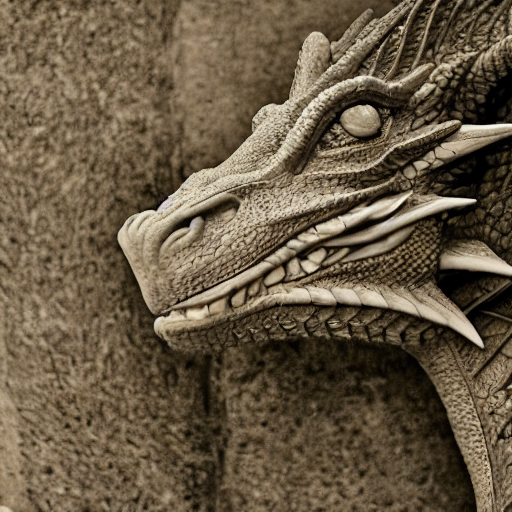

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CLIP-R (retain) : 0.292
CLIP-F (forget) : 0.299
Retain:  FID↓=453.17   IS↑=1.00
Forget:  FID↑=-0.00   IS↓=1.00
✅ SD text projector ready. Try a forget prompt, e.g. 'a photo of a dragon'.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

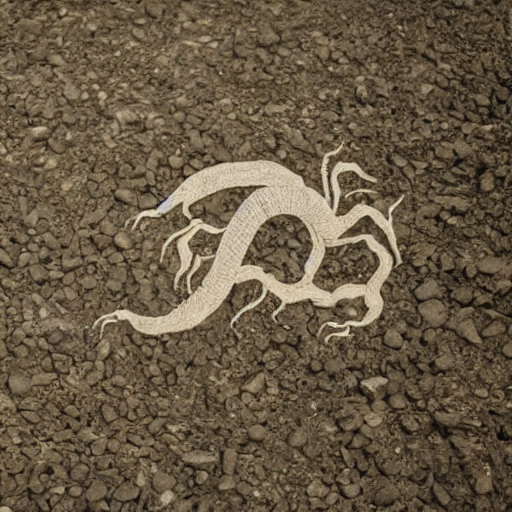

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

sd_id = "runwayml/stable-diffusion-v1-5"  # you can swap to any supported SD1.5 model
pipe = StableDiffusionPipeline.from_pretrained(sd_id, torch_dtype=torch.float16).to(device)
pipe.safety_checker = None  # optional: remove safety for pure research

# --- Build CLIP text embeddings for retain/forget prompts
clip_tok = pipe.tokenizer
text_enc = pipe.text_encoder

forget_prompts = [
    # EDIT: prompts to forget
    "a photo of a dragon",
    "a majestic dragon breathing fire",
]
retain_prompts = [
    # EDIT: prompts to retain
    "a landscape photograph of mountains",
    "a portrait photo of a person in a studio",
]

# --- Generate
def txt2img_before(prompts, guidance_scale=7.5, num_inference_steps=30, seed=42):
    g = torch.Generator(device).manual_seed(seed)
    images = []
    for prompt in prompts:
        img = pipe(prompt, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps, generator=g).images[0]
        images.append(img)
    return images

example_prompts = ["a photo of a dragon", "a majestic dragon breathing fire"]
imgs_before = txt2img_before(example_prompts)
display(imgs_before[0])

def txt2img_before_real(prompts, guidance_scale=7.5, num_inference_steps=30, seed=42):
    g = torch.Generator(device).manual_seed(seed)
    images = []
    for prompt in prompts:
        img = pipe(prompt, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps, generator=g).images[0]
        images.append(img)
    return images

example_prompts = ["a photo of a flying dragon", "a majestic flying dragon breathing fire"]
imgs_before_real = txt2img_before(example_prompts)

# --- Before unlearning
# BEFORE unlearning
imgs_R_before = txt2img_before(retain_prompts) # Call txt2img with the full retain prompts list
imgs_F_before = txt2img_before(forget_prompts) # Call txt2img with the full forget prompts list

# ----------- Metrics -----------
# CLIP alignment (retain should be HIGHER after unlearning; forget should be LOWER)
clip_R1 = compute_clip_alignment(imgs_R_before, retain_prompts)  # CLIP-R ↑ (higher is better retain)
clip_F1 = compute_clip_alignment(imgs_F_before, forget_prompts)  # CLIP-F ↓ (lower is better forgetting)

print(f"CLIP-R (retain) : {clip_R1:.3f}")
print(f"CLIP-F (forget) : {clip_F1:.3f}")

# FID / IS
# If you have a "reference" for retain (e.g., BEFORE images or a real set), compare against it.
# Note: compute_fid_is expects lists of images.
fid_R1, is_R1 = compute_fid_is(imgs_R_before, reference_imgs=imgs_before) # Removed splits=1
fid_F1, is_F1 = compute_fid_is(imgs_F_before, reference_imgs=imgs_before) # Removed splits=1
print(f"Retain:  FID↓={fid_R1:.2f}   IS↑={is_R1:.2f}")
print(f"Forget:  FID↑={fid_F1:.2f}   IS↓={is_F1:.2f}")

def enc_text(prompts):
    with torch.no_grad():
        toks = clip_tok(prompts, padding=True, truncation=True, return_tensors="pt").to(device)
        outs = text_enc(**toks)
        # last_hidden_state: (b, seq, d); pool to sentence embedding
        H = outs.last_hidden_state
        attn = toks["attention_mask"].unsqueeze(-1)
        sent = (H * attn).sum(dim=1) / (attn.sum(dim=1) + 1e-6)  # (b, d)
        return sent.float()

E_f = enc_text(forget_prompts)   # n_f x d
E_r = enc_text(retain_prompts)   # n_r x d

u_forget = mean_diff(E_f, E_r)   # d x 1
U = stack_unit_columns([u_forget])   # d x k
proj_txt = RAProjector(U, metric="ret_cov_inv", retain_feats=E_r).to(device)

# Hook on text encoder forward to project tokenwise hidden states
def txt_projection_hook(module, input, output):
    # output: BaseModelOutputWithPooling
    with torch.no_grad():
        last_hid = output.last_hidden_state  # (b, s, d)
        # Convert hidden states to the same dtype as the projector's metric
        last_hid = last_hid.to(proj_txt.M.dtype)
        last_hid_proj = proj_txt(last_hid)
        return type(output)(last_hidden_state=last_hid_proj, pooler_output=output.pooler_output)

h_text = text_enc.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))

# --- Generate
def txt2img(prompts, guidance_scale=7.5, num_inference_steps=30, seed=42):
    g = torch.Generator(device).manual_seed(seed)
    images = []
    for prompt in prompts:
        img = pipe(prompt, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps, generator=g).images[0]
        images.append(img)
    return images

print("✅ SD text projector ready. Try a forget prompt, e.g. 'a photo of a dragon'.")
# Example usage with a list of prompts
example_prompts = ["a photo of a dragon", "a majestic dragon breathing fire"]

imgs = txt2img(example_prompts)
display(imgs[0])

In [ ]:
# AFTER unlearning (your projector hook active)
imgs_R_after = txt2img(retain_prompts) # Call txt2img with the full retain prompts list
imgs_F_after = txt2img(forget_prompts) # Call txt2img with the full forget prompts list

# ----------- Metrics -----------
# CLIP alignment (retain should be HIGHER after unlearning; forget should be LOWER)
clip_R = compute_clip_alignment(imgs_R_after, retain_prompts)  # CLIP-R ↑ (higher is better retain)
clip_F = compute_clip_alignment(imgs_F_after, forget_prompts)  # CLIP-F ↓ (lower is better forgetting)

print(f"CLIP-R (retain) : {clip_R:.3f}")
print(f"CLIP-F (forget) : {clip_F:.3f}")

# FID / IS
# If you have a "reference" for retain (e.g., BEFORE images or a real set), compare against it.
# Note: compute_fid_is expects lists of images.
fid_R, is_R = compute_fid_is(imgs_R_after, reference_imgs=imgs_R_before) # Removed splits=1
fid_F, is_F = compute_fid_is(imgs_F_after, reference_imgs=imgs_F_before) # Removed splits=1
print(f"Retain:  FID↓={fid_R:.2f}   IS↑={is_R:.2f}")
print(f"Forget:  FID↑={fid_F:.2f}   IS↓={is_F:.2f}")

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CLIP-R (retain) : 0.288
CLIP-F (forget) : 0.249
Retain:  FID↓=75.55   IS↑=1.00
Forget:  FID↑=391.29   IS↓=1.00


0) Install

In [1]:
!pip -q install torch torchvision --index-url https://download.pytorch.org/whl/cu121
!pip -q install diffusers==0.30.0 transformers==4.44.2 accelerate==0.34.2 safetensors==0.4.4
!pip -q install open_clip_torch==2.24.0 pillow==10.4.0 scipy==1.14.1


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 80.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.9/434.9 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 92.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00


1) Utilities: RA-LCN projector + metrics (FID / IS / CLIP)

In [2]:
import torch, torch.nn as nn, torch.nn.functional as F
import numpy as np
from PIL import Image
from torchvision import transforms as T
from torchvision.models import inception_v3, Inception_V3_Weights
from scipy import linalg
import open_clip

device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------------- R A  P R O J E C T O R ----------------
def cov(X: torch.Tensor):
    Xc = X - X.mean(0, keepdim=True)
    n = max(1, Xc.shape[0] - 1)
    return (Xc.T @ Xc) / n

def orthonormalize(U: torch.Tensor):
    Q, _ = torch.linalg.qr(U, mode='reduced')
    return Q

class RAProjector(nn.Module):
    """P = I - U (U^T M U)^-1 U^T M  with  M = Sigma_retain^-1"""
    def __init__(self, U: torch.Tensor, retain_feats: torch.Tensor, eps=1e-6):
        super().__init__()
        d, k = U.shape
        Sigma = cov(retain_feats) + eps * torch.eye(d, device=U.device)
        M = torch.linalg.inv(Sigma)
        Uo = orthonormalize(U)
        self.U = nn.Parameter(Uo, requires_grad=False)
        self.M = nn.Parameter(M,  requires_grad=False)
        G = self.U.T @ self.M @ self.U
        self.Ginv = nn.Parameter(torch.linalg.inv(G + eps*torch.eye(k, device=U.device)), requires_grad=False)

    @torch.no_grad()
    def forward(self, Z: torch.Tensor) -> torch.Tensor:
        # Z: (..., d)
        MZ = torch.tensordot(Z, self.M.T, dims=([-1], [0]))          # (..., d)
        UtMZ = torch.tensordot(MZ, self.U,   dims=([-1], [0]))       # (..., k)
        coeff = torch.tensordot(UtMZ, self.Ginv, dims=([-1], [0]))   # (..., k)
        Ucoeff = torch.tensordot(coeff, self.U.T, dims=([-1], [0]))  # (..., d)
        return Z - Ucoeff

# ---------------- M E T R I C S  (FID / IS / CLIP) ----------------
class InceptionPool(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.net = inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1,
                                aux_logits=True).to(device).eval() # Changed aux_logits to True
        self.tf = T.Compose([
            T.Resize(299, interpolation=T.InterpolationMode.BILINEAR, antialias=True),
            T.CenterCrop(299),
            T.ToTensor(),
            T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
        ])
        self.pool = None
        self.net.avgpool.register_forward_hook(lambda m,i,o: setattr(self, "pool", torch.flatten(o,1)))
        for p in self.net.parameters(): p.requires_grad_(False)

    @torch.no_grad()
    def encode(self, imgs, batch=16):
        pools, logits = [], []
        for i in range(0, len(imgs), batch):
            x = torch.stack([self.tf(im) for im in imgs[i:i+batch]]).to(device)
            out = self.net(x)
            # Handle the case where aux_logits is True and output is a tuple
            if isinstance(out, tuple):
                logits.append(out[0])
            else:
                logits.append(out)
            pools.append(self.pool)

        return torch.cat(pools,0), torch.cat(logits,0)

def _matrix_sqrt_product(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """sqrtm(a @ b) with real part (standard FID practice)"""
    m = linalg.sqrtm(a @ b)
    return m.real if np.iscomplexobj(m) else m

def fid_from_features(fg: np.ndarray, fr: np.ndarray) -> float:
    """feats*: N x 2048 (numpy)"""
    mu1, mu2 = fg.mean(axis=0), fr.mean(axis=0)
    c1, c2 = np.cov(fg, rowvar=False), np.cov(fr, rowvar=False)
    diff = mu1 - mu2
    covmean = _matrix_sqrt_product(c1, c2)
    return float(diff.dot(diff) + np.trace(c1 + c2 - 2*covmean))

@torch.no_grad()
def inception_score_from_logits_safe(logits: torch.Tensor, splits=5, eps=1e-12) -> float:
    """
    Robust IS:
      - logits: (N,1000) torch tensor
      - clamps splits to [1, N]
      - avoids empty splits
      - adds eps inside logs for numerical stability
    """
    if isinstance(logits, (list, tuple)):
        logits = torch.stack(list(logits))
    logits = logits.detach().float().cpu()        # make sure float32 on CPU

    N = logits.shape[0]
    if N == 0:
        raise ValueError("Inception Score: got 0 images.")

    splits = max(1, min(int(splits), N))
    probs = F.softmax(logits, dim=1)

    # split N items into 'splits' chunks as evenly as possible, no empty chunks
    base = N // splits
    rem  = N % splits
    sizes = [base + (1 if i < rem else 0) for i in range(splits)]

    scores = []
    start = 0
    for sz in sizes:
        p = probs[start:start+sz]                 # (sz, 1000)
        start += sz
        if p.numel() == 0:
            continue
        p_y = p.mean(dim=0, keepdim=True)         # (1, 1000)
        kl  = (p * ((p + eps).log() - (p_y + eps).log())).sum(1)
        scores.append(torch.exp(kl.mean()).item())

    return float(np.mean(scores)) if len(scores) > 0 else float("nan")

class CLIPScorer:
    def __init__(self):
        self.model, _, self.preprocess = open_clip.create_model_and_transforms(
            "ViT-B-32", pretrained="openai", device=device
        )
        self.tok = open_clip.get_tokenizer("ViT-B-32")
        self.model.eval()
        for p in self.model.parameters(): p.requires_grad_(False)

    @torch.no_grad()
    def image_text_cos(self, images, prompts, batch=16):
        sims = []
        for i in range(0, len(images), batch):
            ims = images[i:i+batch]; txt = prompts[i:i+batch]
            x = torch.stack([self.preprocess(im).to(device) for im in ims])
            y = self.tok(txt).to(device)
            img_f = F.normalize(self.model.encode_image(x), dim=-1)
            txt_f = F.normalize(self.model.encode_text(y), dim=-1)
            sims.append((img_f * txt_f).sum(-1))
        return float(torch.cat(sims,0).mean().item())


_inception = InceptionPool()
_clip = CLIPScorer()

@torch.no_grad()
def inception_score_from_logits_safe(logits: torch.Tensor, splits: int = 10, eps: float = 1e-12) -> float:
    logits = logits.detach().float().cpu()
    N = logits.shape[0]
    if N == 0:
        raise ValueError("Inception Score: no logits (N=0).")
    splits = max(1, min(int(splits), N))           # never more splits than samples
    probs  = F.softmax(logits, dim=1)

    base, rem = N // splits, N % splits            # split N as evenly as possible
    sizes = [base + (1 if i < rem else 0) for i in range(splits)]
    scores, s = [], 0
    for sz in sizes:
        p   = probs[s:s+sz]; s += sz
        p_y = p.mean(dim=0, keepdim=True)
        kl  = (p * ((p + eps).log() - (p_y + eps).log())).sum(dim=1)
        scores.append(torch.exp(kl.mean()).item())
    return float(np.mean(scores))

def _as_2d(a: np.ndarray) -> np.ndarray:
    a = np.asarray(a)
    if a.ndim == 0:         # scalar -> 1x1
        return a.reshape(1, 1)
    if a.ndim == 1:         # (d,)  -> (1,d)
        return a[np.newaxis, :]
    return a

def _safe_cov(E: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    """
    E: (n,d). If n<2, return small diagonal covariance (keeps it 2-D and PD).
    """
    E = _as_2d(E.astype(float))
    n, d = E.shape
    if n < 2:
        return np.eye(d, dtype=float) * eps
    return np.cov(E, rowvar=False)

def _matrix_sqrt_product(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    a = _as_2d(a).astype(float)
    b = _as_2d(b).astype(float)
    m = linalg.sqrtm(a @ b)
    if np.iscomplexobj(m):
        m = m.real
    return m

def fid_from_features_safe(feats_gen: np.ndarray, feats_ref: np.ndarray, eps: float = 1e-6) -> float:
    """
    feats_*: (n,d). Robust against n<2 and wrong ranks.
    """
    G = _as_2d(np.asarray(feats_gen, dtype=float))
    R = _as_2d(np.asarray(feats_ref, dtype=float))
    if len(G) == 0 or len(R) == 0:
        raise ValueError("FID: one of the feature sets is empty.")

    mu_g, mu_r = G.mean(axis=0), R.mean(axis=0)
    Cg, Cr     = _safe_cov(G, eps), _safe_cov(R, eps)
    diff       = (mu_g - mu_r).reshape(-1)
    covmean    = _matrix_sqrt_product(Cg, Cr)
    fid        = diff @ diff + np.trace(Cg + Cr - 2.0 * covmean)
    return float(fid)


def compute_fid_is_clip_safe(gen_imgs, ref_imgs, prompts):
    # using your existing _inception.encode and _clip.image_text_cos
    pool_g, logits_g = _inception.encode(gen_imgs)
    pool_r, _        = _inception.encode(ref_imgs)

    fid  = fid_from_features_safe(pool_g.cpu().numpy(), pool_r.cpu().numpy())
    is_  = inception_score_from_logits_safe(logits_g, splits=min(5, len(gen_imgs)))
    clip = _clip.image_text_cos(gen_imgs, prompts)
    return fid, is_, clip

/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:01<00:00, 97.4MB/s]
100%|███████████████████████████████████████| 354M/354M [00:04<00:00, 72.7MiB/s]


2) Patch maker + BLIP captioner (center vs non-center)

In [3]:
from transformers import BlipProcessor, BlipForConditionalGeneration
import math

# BLIP captioner (fast-ish, good quality)
blip_proc = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device).eval()

def caption_images(imgs, max_new_tokens=20):
    caps = []
    for im in imgs:
        inputs = blip_proc(images=im, return_tensors="pt").to(device)
        out = blip_model.generate(**inputs, max_new_tokens=max_new_tokens)
        caps.append(blip_proc.decode(out[0], skip_special_tokens=True))
    return caps

def center_square(im: Image.Image) -> Image.Image:
    w, h = im.size
    s = min(w, h)
    left = (w - s)//2
    top  = (h - s)//2
    return im.crop((left, top, left+s, top+s))

def split_grid(im: Image.Image, grid=8):
    w, h = im.size
    tw, th = w//grid, h//grid
    tiles = []
    for gy in range(grid):
        for gx in range(grid):
            tiles.append(im.crop((gx*tw, gy*th, (gx+1)*tw, (gy+1)*th)))
    return tiles, (tw, th)

def make_center_vs_others_patches(im: Image.Image, grid=8, center_frac=0.5):
    """
    1) Take a center square crop
    2) Split into grid x grid patches
    3) Mark inner region (~center_frac of the square) as 'forget' patches, others as 'retain'
    """
    sq = center_square(im)
    tiles, (tw, th) = split_grid(sq, grid=grid)
    tiles2d = [tiles[i*grid:(i+1)*grid] for i in range(grid)]

    # central band indices
    c0 = int((1-center_frac)/2 * grid)
    c1 = grid - c0
    forget, retain = [], []
    for y in range(grid):
        for x in range(grid):
            if (c0 <= x < c1) and (c0 <= y < c1):
                forget.append(tiles2d[y][x])
            else:
                retain.append(tiles2d[y][x])
    return forget, retain, sq


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

3) Build U in SD text-encoder space (caption → text embeddings)

In [4]:
from diffusers import StableDiffusionImg2ImgPipeline

# SD 1.5 img2img
sd_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(sd_id, torch_dtype=torch.float16).to(device)
pipe.safety_checker = None
tok = pipe.tokenizer
text_enc = pipe.text_encoder

@torch.no_grad()
def enc_text(prompts):
    toks = tok(prompts, padding=True, truncation=True, return_tensors="pt").to(device)
    out  = text_enc(**toks)
    H    = out.last_hidden_state                    # (b, seq, d=768)
    attn = toks["attention_mask"].unsqueeze(-1)
    sent = (H * attn).sum(1) / (attn.sum(1) + 1e-6) # (b, d)
    return sent.float()

# Load your test image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
import requests, io
img = Image.open(io.BytesIO(requests.get(url).content)).convert("RGB").resize((768,768))

# Patches: central 50% region, 8x8 grid
forget_patches, retain_patches, central_square = make_center_vs_others_patches(img, grid=8, center_frac=0.5)

# Caption them
forget_caps = caption_images(forget_patches)
retain_caps = caption_images(retain_patches)
print("Center captions (forget):", forget_caps[:3], " ...")
print("Other captions  (retain):", retain_caps[:3], " ...")

# Embed captions in SD text-encoder space (768-D)
E_f = enc_text(forget_caps)   # n_f x 768
E_r = enc_text(retain_caps)   # n_r x 768

# Build U (mean-diff) and projector
u = (E_f.mean(0, keepdim=True) - E_r.mean(0, keepdim=True)).T
u = u / (u.norm() + 1e-8)
U = u                              # (768 x 1)
proj_txt = RAProjector(U, retain_feats=E_r).to(device)

# Hook on text-encoder outputs (token-wise projection)
def txt_projection_hook(module, inputs, output):
    with torch.no_grad():
        hid = output.last_hidden_state.float()
        hid_p = proj_txt(hid)
        return type(output)(last_hidden_state=hid_p, pooler_output=output.pooler_output)

# Small helper to run img2img
def img2img(prompt, init_img, steps=30, guidance=7.5, strength=0.65, seed=0):
    g = torch.Generator(device).manual_seed(seed)
    out = pipe(prompt=prompt, image=init_img, strength=strength,
               guidance_scale=guidance, num_inference_steps=steps, generator=g)
    return out.images[0]


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Center captions (forget): ['a man in a black shirt and a green background', "a close up of a cat's eye", 'a black and white cat']  ...
Other captions  (retain): ['a green background with a white border', 'a green background with a white border', 'a black bird flying through the air']  ...


4) Run before vs after unlearning + metrics

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

BEFORE (retain)


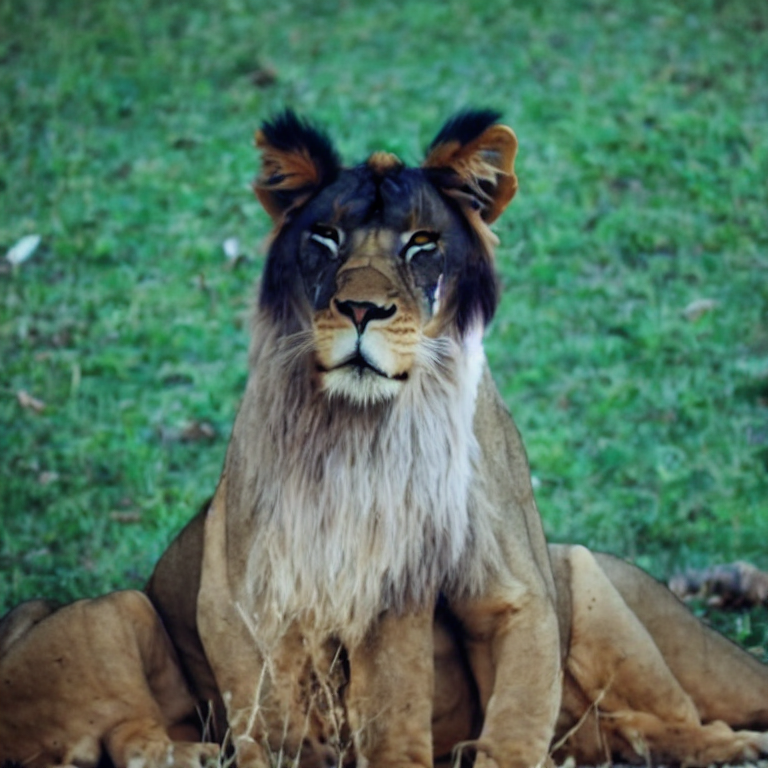

AFTER  (retain)


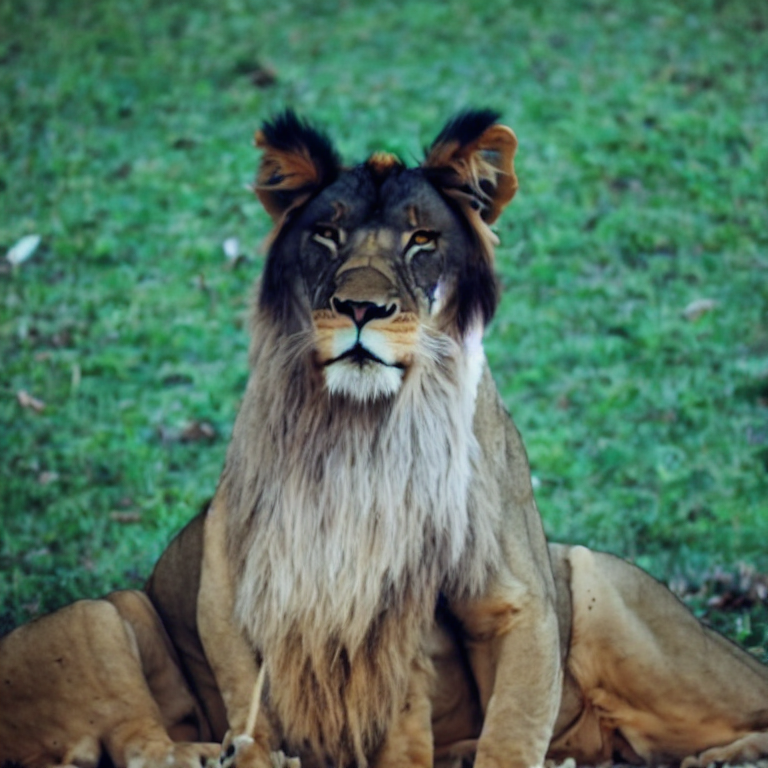

BEFORE (forget)


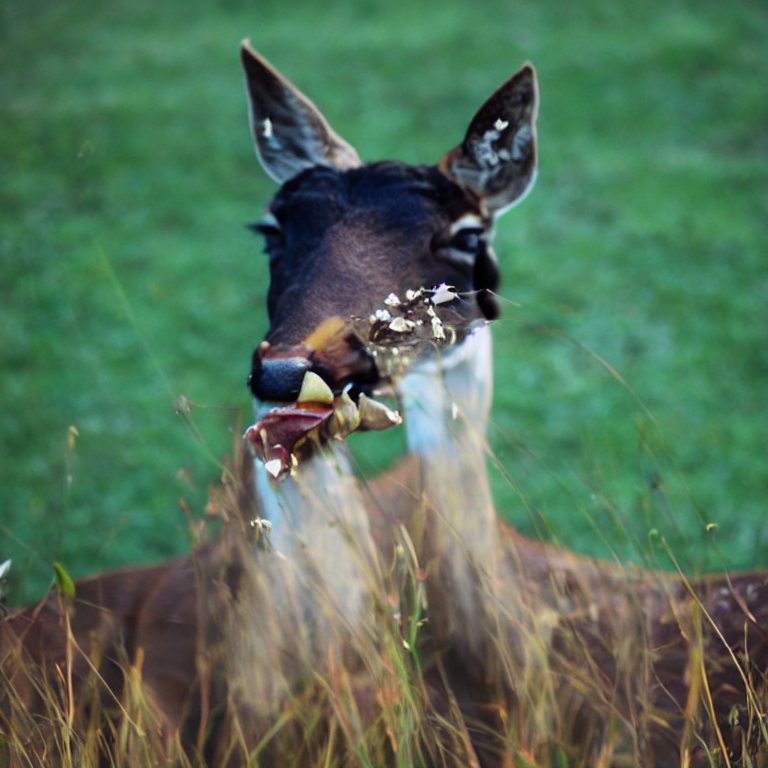

AFTER  (forget)


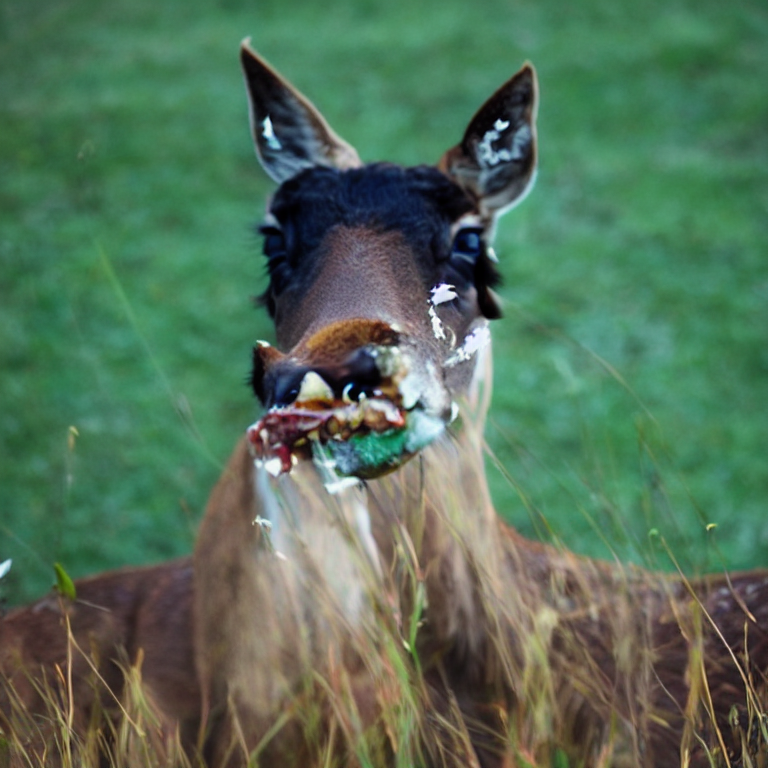


=== Metrics (AFTER vs BEFORE) ===
Retain: FID↓=27.18   IS↑=1.00   CLIP-R↑=0.287
Forget: FID↑=122.45   IS↓=1.00   CLIP-F↓=0.301


In [5]:
#retain_prompt = "high-quality photo of the scene"
#forget_prompt = "photo of the center object in the scene"  # generic; we’ll use the same prompt list for CLIP

retain_prompt = "A lion is sitting on the ground and watching"
forget_prompt = "A deer is eating the grass"  # generic; we’ll use the same prompt list for CLIP

# BEFORE (no hook)
imgs_R_before = [img2img(retain_prompt, img, seed=123)]
imgs_F_before = [img2img(forget_prompt, img, seed=456)]

# AFTER (activate projector)
h_text = text_enc.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))
imgs_R_after  = [img2img(retain_prompt, img, seed=123)]
imgs_F_after  = [img2img(forget_prompt, img, seed=456)]
h_text.remove()

# Show
display(Image.new("RGB",(1,1)))  # noop to ensure displays
print("BEFORE (retain)"); display(imgs_R_before[0])
print("AFTER  (retain)"); display(imgs_R_after[0])
print("BEFORE (forget)"); display(imgs_F_before[0])
print("AFTER  (forget)"); display(imgs_F_after[0])

# ---- Metrics: compare AFTER to BEFORE ----
fid_R, is_R, clip_R = compute_fid_is_clip_safe(imgs_R_after, imgs_R_before, [retain_prompt])
fid_F, is_F, clip_F = compute_fid_is_clip_safe(imgs_F_after, imgs_F_before, [forget_prompt])

print("\n=== Metrics (AFTER vs BEFORE) ===")
print(f"Retain: FID↓={fid_R:.2f}   IS↑={is_R:.2f}   CLIP-R↑={clip_R:.3f}")
print(f"Forget: FID↑={fid_F:.2f}   IS↓={is_F:.2f}   CLIP-F↓={clip_F:.3f}")


8X8

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

# SD 1.5 img2img
sd_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(sd_id, torch_dtype=torch.float16).to(device)
pipe.safety_checker = None
tok = pipe.tokenizer
text_enc = pipe.text_encoder

@torch.no_grad()
def enc_text(prompts):
    toks = tok(prompts, padding=True, truncation=True, return_tensors="pt").to(device)
    out  = text_enc(**toks)
    H    = out.last_hidden_state                    # (b, seq, d=768)
    attn = toks["attention_mask"].unsqueeze(-1)
    sent = (H * attn).sum(1) / (attn.sum(1) + 1e-6) # (b, d)
    return sent.float()

# Load your test image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
import requests, io
img = Image.open(io.BytesIO(requests.get(url).content)).convert("RGB").resize((768,768))

# Patches: central 50% region, 8x8 grid
forget_patches, retain_patches, central_square = make_center_vs_others_patches(img, grid=8, center_frac=0.5)

# Caption them
forget_caps = caption_images(forget_patches)
retain_caps = caption_images(retain_patches)
print("Center captions (forget):", forget_caps[:3], " ...")
print("Other captions  (retain):", retain_caps[:3], " ...")

# Embed captions in SD text-encoder space (768-D)
E_f = enc_text(forget_caps)   # n_f x 768
E_r = enc_text(retain_caps)   # n_r x 768

# Build U (mean-diff) and projector
u = (E_f.mean(0, keepdim=True) - E_r.mean(0, keepdim=True)).T
u = u / (u.norm() + 1e-8)
U = u                              # (768 x 1)
proj_txt = RAProjector(U, retain_feats=E_r).to(device)

# Hook on text-encoder outputs (token-wise projection)
def txt_projection_hook(module, inputs, output):
    with torch.no_grad():
        hid = output.last_hidden_state.float()
        hid_p = proj_txt(hid)
        return type(output)(last_hidden_state=hid_p, pooler_output=output.pooler_output)

# Small helper to run img2img
def img2img(prompt, init_img, steps=30, guidance=7.5, strength=0.65, seed=0):
    g = torch.Generator(device).manual_seed(seed)
    out = pipe(prompt=prompt, image=init_img, strength=strength,
               guidance_scale=guidance, num_inference_steps=steps, generator=g)
    return out.images[0]


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Center captions (forget): ['a man in a black shirt and a green background', "a close up of a cat's eye", 'a black and white cat']  ...
Other captions  (retain): ['a green background with a white border', 'a green background with a white border', 'a black bird flying through the air']  ...


  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

BEFORE (retain)


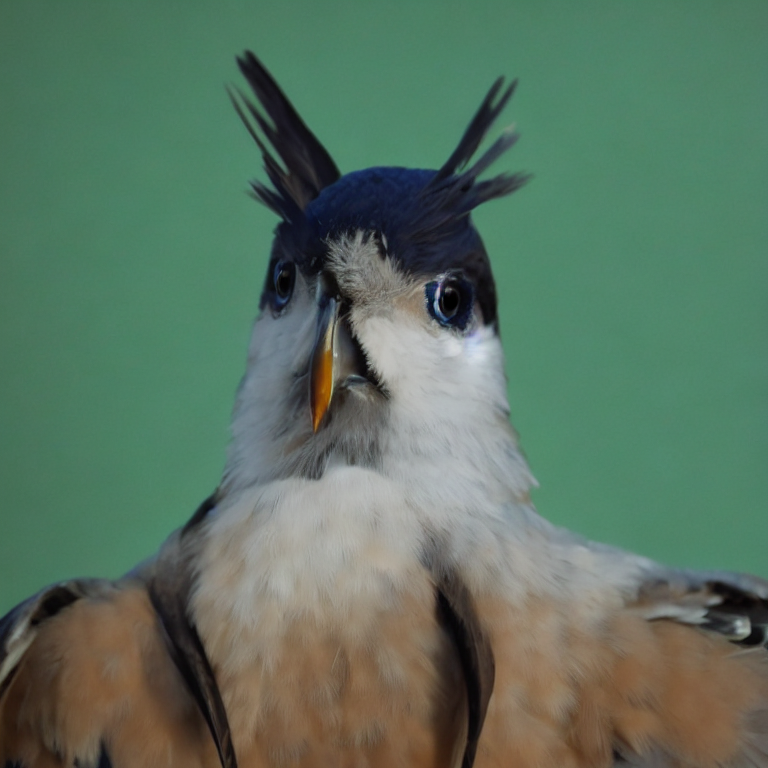

AFTER  (retain)


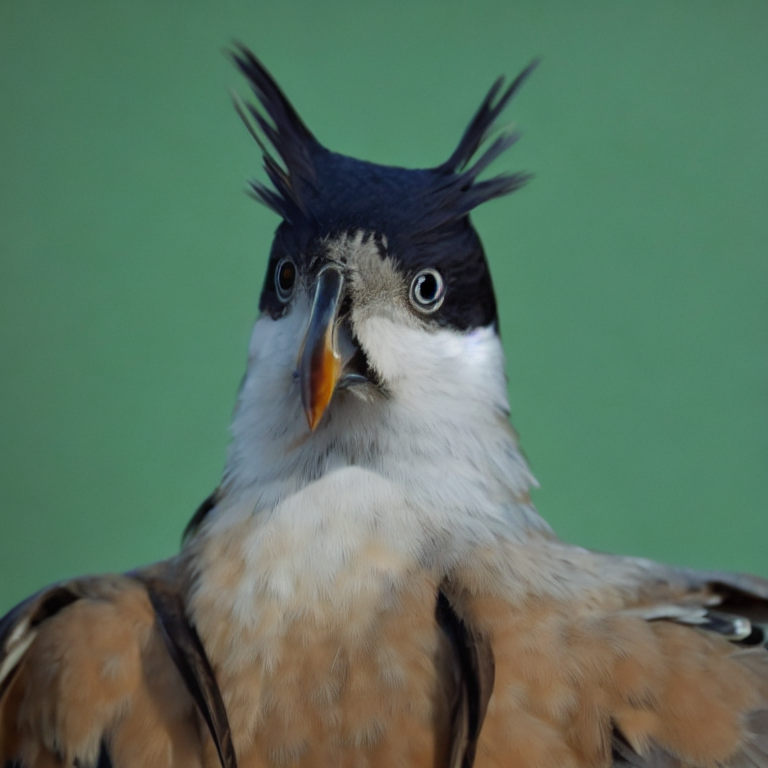

BEFORE (forget)


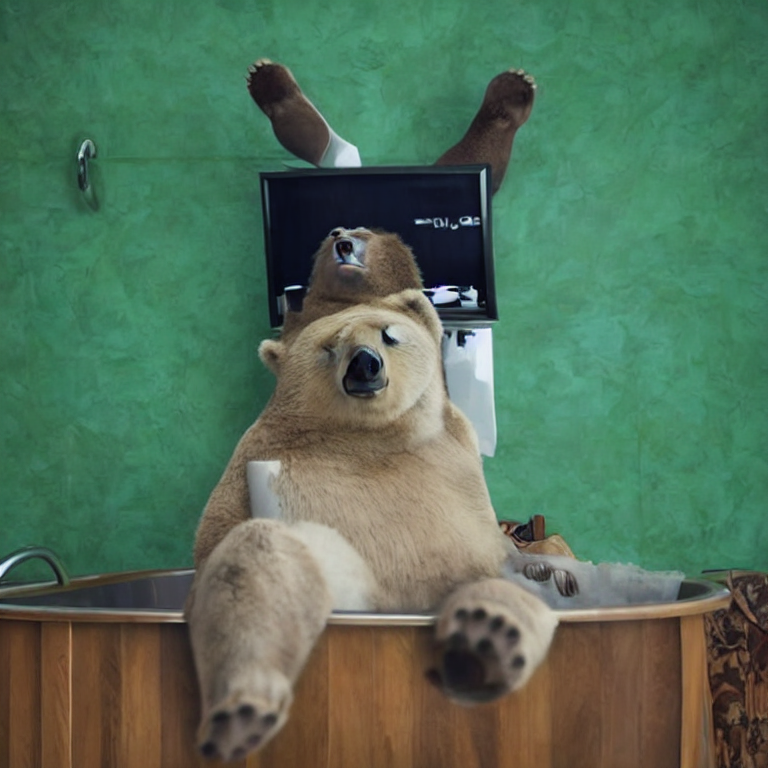

AFTER  (forget)


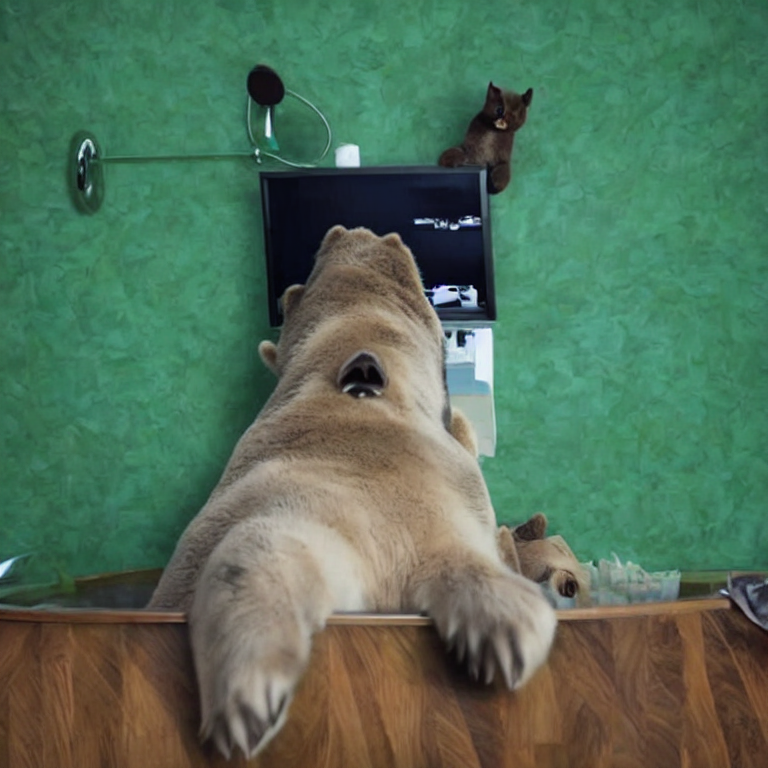


=== Metrics (AFTER vs BEFORE) ===
Retain: FID↓=54.10   IS↑=1.00   CLIP-R↑=0.256
Forget: FID↑=288.01   IS↓=1.00   CLIP-F↓=0.299


In [ ]:
#retain_prompt = "high-quality photo of the scene"
#forget_prompt = "photo of the center object in the scene"  # generic; we’ll use the same prompt list for CLIP
retain_prompt = "A bird is flying"
forget_prompt = "A bear is bathing himself while watching TV"

# BEFORE (no hook)
imgs_R_before = [img2img(retain_prompt, img, seed=123)]
imgs_F_before = [img2img(forget_prompt, img, seed=456)]

# AFTER (activate projector)
h_text = text_enc.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))
imgs_R_after  = [img2img(retain_prompt, img, seed=123)]
imgs_F_after  = [img2img(forget_prompt, img, seed=456)]
h_text.remove()

# Show
display(Image.new("RGB",(1,1)))  # noop to ensure displays
print("BEFORE (retain)"); display(imgs_R_before[0])
print("AFTER  (retain)"); display(imgs_R_after[0])
print("BEFORE (forget)"); display(imgs_F_before[0])
print("AFTER  (forget)"); display(imgs_F_after[0])

# ---- Metrics: compare AFTER to BEFORE ----
fid_R, is_R, clip_R = compute_fid_is_clip_safe(imgs_R_after, imgs_R_before, [retain_prompt])
fid_F, is_F, clip_F = compute_fid_is_clip_safe(imgs_F_after, imgs_F_before, [forget_prompt])

print("\n=== Metrics (AFTER vs BEFORE) ===")
print(f"Retain: FID↓={fid_R:.2f}   IS↑={is_R:.2f}   CLIP-R↑={clip_R:.3f}")
print(f"Forget: FID↑={fid_F:.2f}   IS↓={is_F:.2f}   CLIP-F↓={clip_F:.3f}")


**16X16**

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

# SD 1.5 img2img
sd_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(sd_id, torch_dtype=torch.float16).to(device)
pipe.safety_checker = None
tok = pipe.tokenizer
text_enc = pipe.text_encoder

@torch.no_grad()
def enc_text(prompts):
    toks = tok(prompts, padding=True, truncation=True, return_tensors="pt").to(device)
    out  = text_enc(**toks)
    H    = out.last_hidden_state                    # (b, seq, d=768)
    attn = toks["attention_mask"].unsqueeze(-1)
    sent = (H * attn).sum(1) / (attn.sum(1) + 1e-6) # (b, d)
    return sent.float()

# Load your test image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
import requests, io
img = Image.open(io.BytesIO(requests.get(url).content)).convert("RGB").resize((768,768))

# Patches: central 50% region, 8x8 grid
forget_patches, retain_patches, central_square = make_center_vs_others_patches(img, grid=16, center_frac=0.5)

# Caption them
forget_caps = caption_images(forget_patches)
retain_caps = caption_images(retain_patches)
print("Center captions (forget):", forget_caps[:3], " ...")
print("Other captions  (retain):", retain_caps[:3], " ...")

# Embed captions in SD text-encoder space (768-D)
E_f = enc_text(forget_caps)   # n_f x 768
E_r = enc_text(retain_caps)   # n_r x 768

# Build U (mean-diff) and projector
u = (E_f.mean(0, keepdim=True) - E_r.mean(0, keepdim=True)).T
u = u / (u.norm() + 1e-8)
U = u                              # (768 x 1)
proj_txt = RAProjector(U, retain_feats=E_r).to(device)

# Hook on text-encoder outputs (token-wise projection)
def txt_projection_hook(module, inputs, output):
    with torch.no_grad():
        hid = output.last_hidden_state.float()
        hid_p = proj_txt(hid)
        return type(output)(last_hidden_state=hid_p, pooler_output=output.pooler_output)

# Small helper to run img2img
def img2img(prompt, init_img, steps=30, guidance=7.5, strength=0.65, seed=0):
    g = torch.Generator(device).manual_seed(seed)
    out = pipe(prompt=prompt, image=init_img, strength=strength,
               guidance_scale=guidance, num_inference_steps=steps, generator=g)
    return out.images[0]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Center captions (forget): ['a green background with a white border', 'a black cat with a green background', 'a black and white photo of a man with a beard']  ...
Other captions  (retain): ['a green background with a white border', 'a green background with a white border', 'a green background with a white border']  ...


  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

BEFORE (retain)


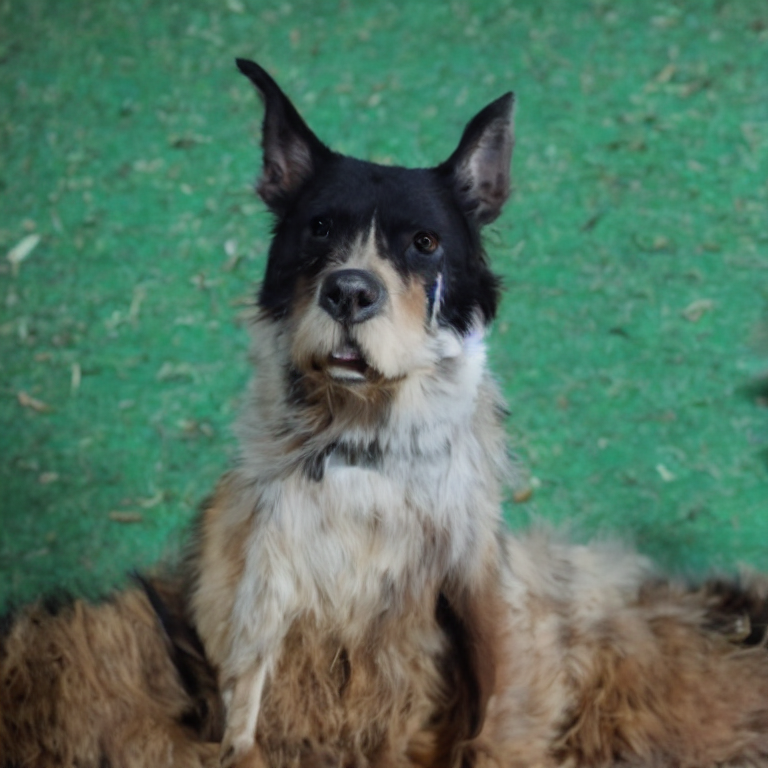

AFTER  (retain)


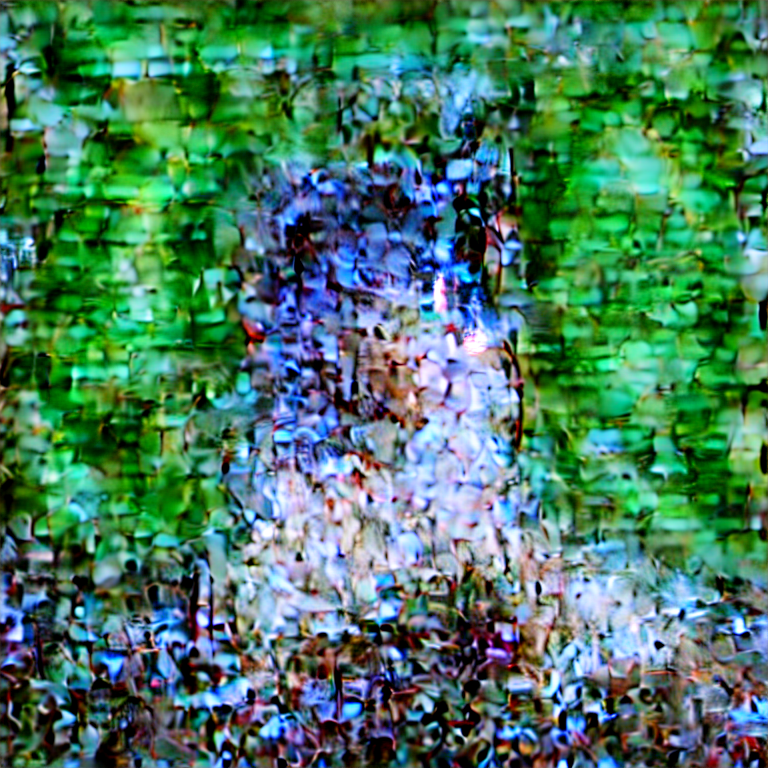

BEFORE (forget)


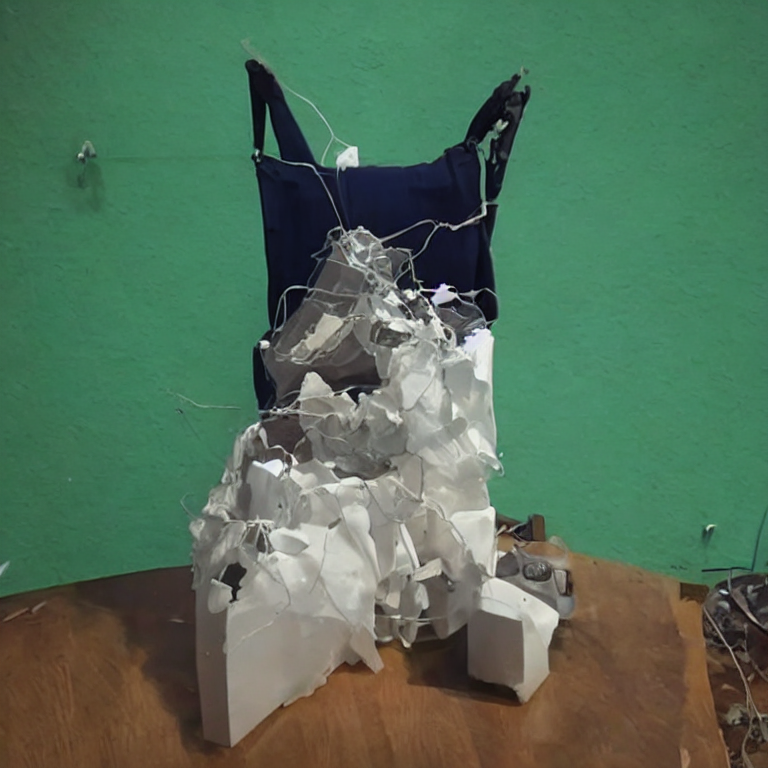

AFTER  (forget)


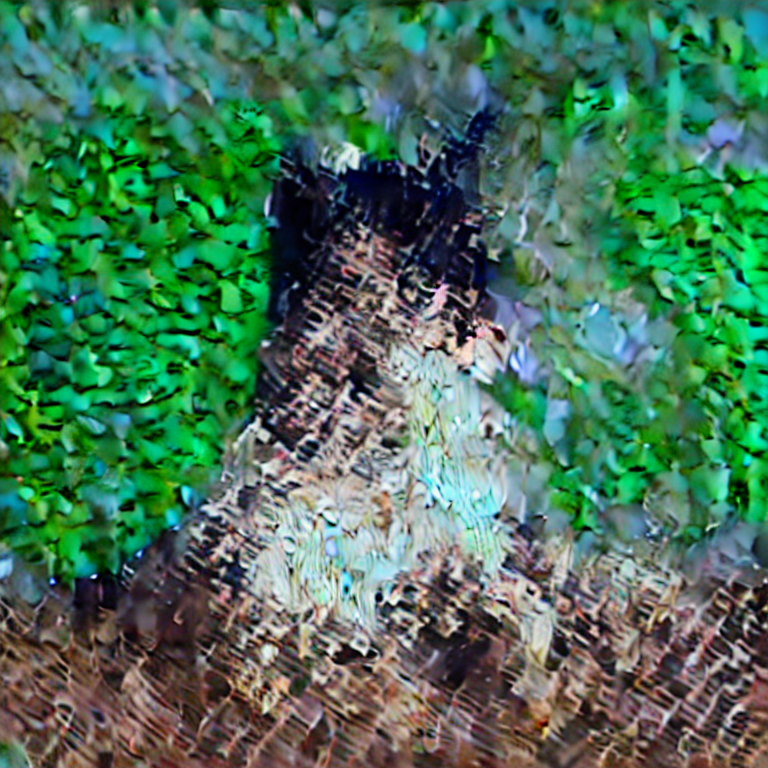


=== Metrics (AFTER vs BEFORE) ===
Retain: FID↓=427.41   IS↑=1.00   CLIP-R↑=0.228
Forget: FID↑=649.50   IS↓=1.00   CLIP-F↓=0.240


In [ ]:
retain_prompt = "high-quality photo of the scene"
forget_prompt = "photo of the center object in the scene"  # generic; we’ll use the same prompt list for CLIP

# BEFORE (no hook)
imgs_R_before = [img2img(retain_prompt, img, seed=123)]
imgs_F_before = [img2img(forget_prompt, img, seed=456)]

# AFTER (activate projector)
h_text = text_enc.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))
imgs_R_after  = [img2img(retain_prompt, img, seed=123)]
imgs_F_after  = [img2img(forget_prompt, img, seed=456)]
h_text.remove()

# Show
display(Image.new("RGB",(1,1)))  # noop to ensure displays
print("BEFORE (retain)"); display(imgs_R_before[0])
print("AFTER  (retain)"); display(imgs_R_after[0])
print("BEFORE (forget)"); display(imgs_F_before[0])
print("AFTER  (forget)"); display(imgs_F_after[0])

# ---- Metrics: compare AFTER to BEFORE ----
fid_R, is_R, clip_R = compute_fid_is_clip_safe(imgs_R_after, imgs_R_before, [retain_prompt])
fid_F, is_F, clip_F = compute_fid_is_clip_safe(imgs_F_after, imgs_F_before, [forget_prompt])

print("\n=== Metrics (AFTER vs BEFORE) ===")
print(f"Retain: FID↓={fid_R:.2f}   IS↑={is_R:.2f}   CLIP-R↑={clip_R:.3f}")
print(f"Forget: FID↑={fid_F:.2f}   IS↓={is_F:.2f}   CLIP-F↓={clip_F:.3f}")


---------------------------------------------------------
Colab cell 5 — Image→Image (SD img2img) with RA-LCN on text encoder

Same projector; we just feed an init image and a prompt. You can also add an image-encoder projection (e.g., on CLIP image encoder or the VAE latents) similarly if you want stronger forgetting.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

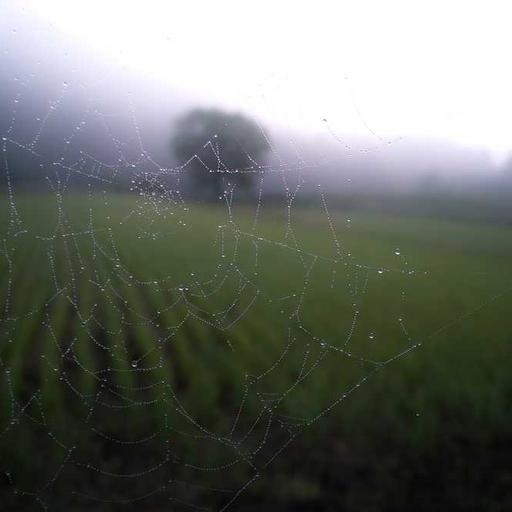

✅ SD img2img projector ready.


  0%|          | 0/21 [00:00<?, ?it/s]

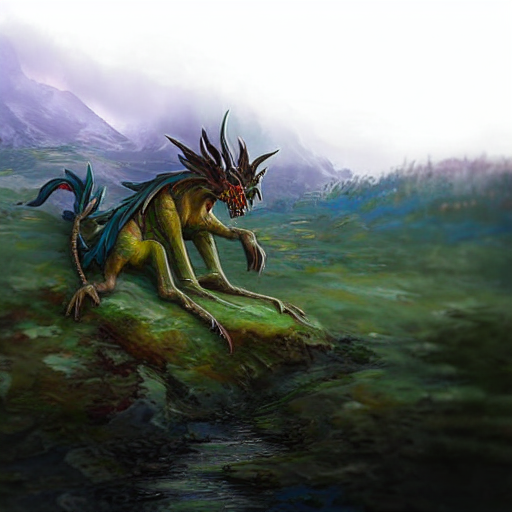

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from PIL import Image
import requests, io

pipe_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(sd_id, torch_dtype=torch.float16).to(device)
pipe_i2i.safety_checker = None

# Reuse the SAME text encoder projector hook:
h_text_i2i = pipe_i2i.text_encoder.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))

def img2img(prompt, init_img: Image.Image, strength=0.6, guidance_scale=7.5, steps=30, seed=0):
    g = torch.Generator(device).manual_seed(seed)
    out = pipe_i2i(prompt=prompt, image=init_img, strength=strength, guidance_scale=guidance_scale, num_inference_steps=steps, generator=g)
    return out.images[0]

# Demo init image
url = "https://picsum.photos/512/512"
init = Image.open(io.BytesIO(requests.get(url).content)).convert("RGB").resize((512,512))
display(init)

print("✅ SD img2img projector ready.")
out = img2img("a photo of a dragon painted onto this scene", init, strength=0.7)
display(out)


B. Image→Image (reuse your image metrics)
If you already have the earlier functions:

compute_fid_is(generated_imgs, reference_imgs)

compute_clip_alignment(images, prompts)

you can add a small wrapper:

In [ ]:
def eval_img2img(pipe_i2i, prompts, init_images, seeds=None, steps=30, guidance=7.5, strength=0.7):
    """
    Generate one output per (prompt, init_image[, seed]) pair and return images.
    seeds: optional list same length as prompts (or int for one shared seed).
    """
    out_imgs = []
    if seeds is None:
        seeds = [0]*len(prompts)
    if isinstance(seeds, int):
        seeds = [seeds]*len(prompts)

    for p, im, sd in zip(prompts, init_images, seeds):
        g = torch.Generator(device).manual_seed(sd)
        img = pipe_i2i(prompt=p, image=im, strength=strength, guidance_scale=guidance, num_inference_steps=steps, generator=g).images[0]
        out_imgs.append(img)
    return out_imgs

def eval_img2img_metrics(imgs_after, imgs_before, prompts):
    fid, is_score = compute_fid_is(imgs_after, reference_imgs=imgs_before, splits=max(1, len(imgs_after)//10))
    clip = compute_clip_alignment(imgs_after, prompts)
    return {"FID": fid, "IS": is_score, "CLIP": clip}


Great! Here’s a Colab-ready metrics kit you can drop in after your RA-LCN code to compute:

FID (Fréchet Inception Distance)

IS (Inception Score)

CLIP-R and CLIP-F (average image–text cosine similarity on Retain / Forget prompt sets)

It works with lists of PIL.Image (your generated images) and the corresponding prompts.

Metrics helpers

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from torchvision.models import inception_v3, Inception_V3_Weights
from torchvision import transforms as T
from scipy import linalg
from PIL import Image
import open_clip

device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- Inception feature extractor (pool3, 2048-d) ----------
class InceptionPool3(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.net = inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1, transform_input=False, aux_logits=False).to(device).eval()
        for p in self.net.parameters():
            p.requires_grad_(False)

        # torchvision’s transform for inception
        self.tf = T.Compose([
            T.Resize(299, interpolation=T.InterpolationMode.BILINEAR, antialias=True),
            T.CenterCrop(299),
            T.ToTensor(),
            T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
        ])

    @torch.no_grad()
    def forward(self, imgs: list[Image.Image], batch=32):
        feats, logits = [], []
        for i in range(0, len(imgs), batch):
            x = torch.stack([self.tf(im) for im in imgs[i:i+batch]]).to(device)
            # logits before softmax
            out = self.net(x)
            # pool3 features sit in self.net.avgpool -> flatten -> fc
            # easier: take output from self.net._forward_impl parts:
            # but torchvision returns class logits; to get pool features, re-run up to avgpool
            # Simpler workaround: hook the avgpool output
            pass


/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


You got it—here are drop-in Colab helpers for Inception Score (IS) and CLIP-R / CLIP-F.
They take lists of PIL.Image (your generations) and the matching prompts

In [ ]:
import torch, torch.nn.functional as F
from torchvision.models import inception_v3, Inception_V3_Weights
from torchvision import transforms as T
from PIL import Image
import numpy as np
import open_clip

device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- Inception Score ----------
class InceptionLogits(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.net = inception_v3(
            weights=Inception_V3_Weights.IMAGENET1K_V1,
            aux_logits=True, # Changed from False to True
            transform_input=False
        ).to(device).eval()
        for p in self.net.parameters(): p.requires_grad_(False)
        self.tf = T.Compose([
            T.Resize(299, interpolation=T.InterpolationMode.BILINEAR, antialias=True),
            T.CenterCrop(299),
            T.ToTensor(),
            T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
        ])

    @torch.no_grad()
    def logits(self, imgs, batch=32):
        outs = []
        for i in range(0, len(imgs), batch):
            x = torch.stack([self.tf(im) for im in imgs[i:i+batch]]).to(device)
            out = self.net(x)            # N x 1000 (pre-softmax)
            # When aux_logits is True, the output is a named tuple. We need the primary output.
            if isinstance(out, tuple):
                outs.append(out[0])
            else:
                outs.append(out)
        return torch.cat(outs, 0)

_inception_logits = InceptionLogits()

@torch.no_grad()
def inception_score(images, splits=10):
    """
    Inception Score on a list of PIL Images.
    Return scalar IS.
    """
    logits = _inception_logits.logits(images)         # N x 1000
    probs  = F.softmax(logits, dim=1)                 # N x 1000
    N = probs.shape[0]
    splits = max(1, min(splits, N))
    split_size = N // splits
    scores = []
    for s in range(splits):
        p = probs[s*split_size : (s+1)*split_size]    # n x 1000
        py = p.mean(dim=0, keepdim=True)              # 1 x 1000
        kl = (p * (p.log() - py.log())).sum(dim=1)    # n
        scores.append(torch.exp(kl.mean()).item())
    return float(np.mean(scores))

# ---------- CLIP alignment (R/F) ----------
class CLIPAlign:
    def __init__(self, model_name="ViT-B-32", pretrained="openai"):
        self.model, _, self.preprocess = open_clip.create_model_and_transforms(
            model_name, pretrained=pretrained, device=device
        )
        self.tok = open_clip.get_tokenizer(model_name)
        self.model.eval()
        for p in self.model.parameters(): p.requires_grad_(False)

    @torch.no_grad()
    def image_text_cos(self, images, prompts, batch=32):
        assert len(images) == len(prompts)
        sims = []
        for i in range(0, len(images), batch):
            ims = images[i:i+batch]
            txt = prompts[i:i+batch]
            x = torch.stack([self.preprocess(im).to(device) for im in ims])  # N x 3x224x224
            y = self.tok(txt).to(device)                                     # N x tok
            img_f = F.normalize(self.model.encode_image(x), dim=-1)          # N x d
            txt_f = F.normalize(self.model.encode_text(y), dim=-1)           # N x d
            sims.append((img_f * txt_f).sum(dim=-1))                         # N
        return float(torch.cat(sims, 0).mean().item())

_clip = CLIPAlign()

def clip_R(images_retain, prompts_retain):
    """Higher is better after unlearning (retain quality)."""
    return _clip.image_text_cos(images_retain, prompts_retain)

def clip_F(images_forget, prompts_forget):
    """Lower is better after unlearning (forget quality)."""
    return _clip.image_text_cos(images_forget, prompts_forget)

In [ ]:
# Suppose you already generated images:
# imgs_R_before, imgs_R_after for retain prompts
# imgs_F_before, imgs_F_after for forget prompts
# and you have lists: retain_prompts, forget_prompts

# Inception Score (on generated sets)
is_retain = inception_score(imgs_R_after, splits=5)
is_forget = inception_score(imgs_F_after, splits=5)
print(f"IS (retain) ↑  : {is_retain:.2f}")
print(f"IS (forget) ↓? : {is_forget:.2f}")  # usually drops when forgetting works

# CLIP alignment
clip_r = clip_R(imgs_R_after, retain_prompts)  # want ↑
clip_f = clip_F(imgs_F_after, forget_prompts)  # want ↓
print(f"CLIP-R (retain) ↑ : {clip_r:.3f}")
print(f"CLIP-F (forget) ↓ : {clip_f:.3f}")


IS (retain) ↑  : 1.00
IS (forget) ↓? : 1.00
CLIP-R (retain) ↑ : 0.277
CLIP-F (forget) ↓ : 0.265


In [ ]:
import open_clip
from PIL import Image
import requests, io

device = "cuda" if torch.cuda.is_available() else "cpu"

model, _, preprocess = open_clip.create_model_and_transforms(
    "ViT-B-32", pretrained="openai", device=device
)
model.eval()

def img_embed(urls):
    ims = []
    for u in urls:
        img = Image.open(io.BytesIO(requests.get(u).content)).convert("RGB")
        ims.append(preprocess(img).to(device))
    x = torch.stack(ims)
    with torch.no_grad():
        e = model.encode_image(x)
        e = F.normalize(e, dim=-1)
    return e

# Example: forget "cat", retain "dog"
forget_urls = [
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
]
retain_urls = [
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/bee2.JPG",
    "https://picsum.photos/256/256"
]

Ef = img_embed(forget_urls)
Er = img_embed(retain_urls)

u_forget = (Ef.mean(0, keepdim=True) - Er.mean(0, keepdim=True)).T   # d x 1
U = u_forget / (u_forget.norm() + 1e-8)
proj = RAProjector(U, retain_feats=Er).to(device)
print("Projector ready.")


Projector ready.


Hook into Stable Diffusion Img2Img

We’ll project the text encoder hidden states (the easiest hook) and optionally also CLIP image encoder.

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from PIL import Image
import requests, io

sd_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(sd_id, torch_dtype=torch.float16).to(device)
pipe.safety_checker = None

# Hook to project the CLIP text encoder outputs
def txt_projection_hook(module, inputs, output):
    with torch.no_grad():
        h = output.last_hidden_state  # (b, seq, d)
        h_proj = proj(h.float())      # apply RLCN
        return type(output)(last_hidden_state=h_proj, pooler_output=output.pooler_output)

h_text = pipe.text_encoder.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Run unlearning on an example image

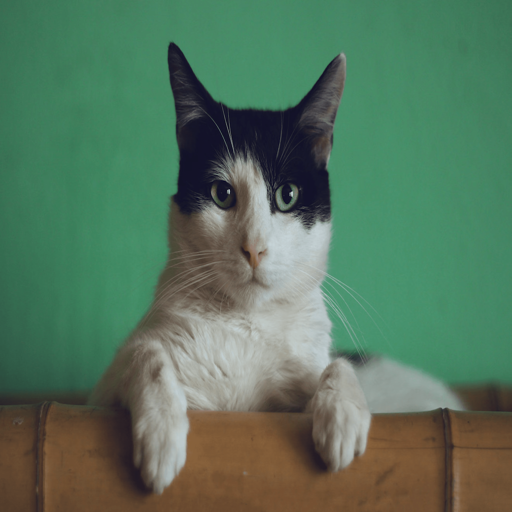

  0%|          | 0/21 [00:00<?, ?it/s]

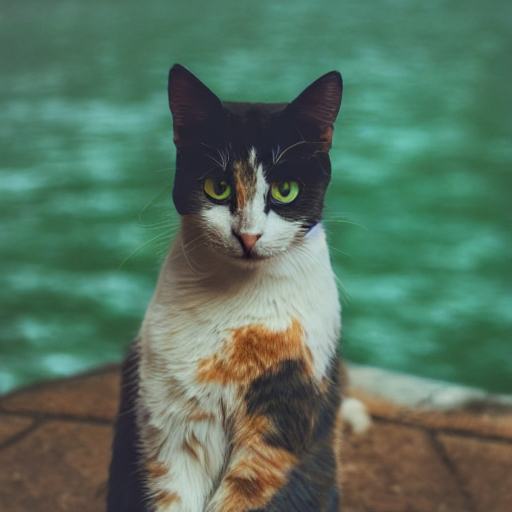

  0%|          | 0/21 [00:00<?, ?it/s]

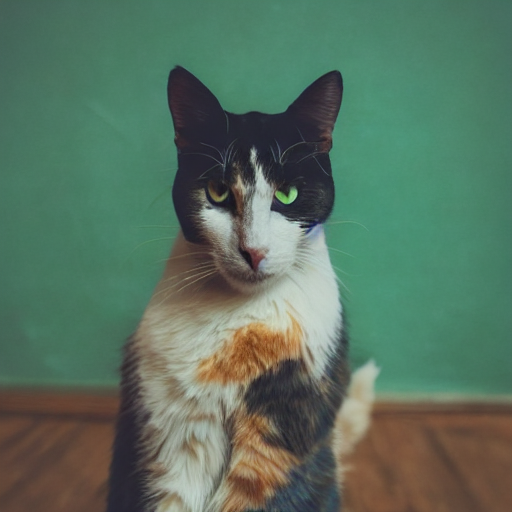

In [ ]:
# get an input image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
init_img = Image.open(io.BytesIO(requests.get(url).content)).convert("RGB").resize((512,512))
display(init_img)

prompt = "a photo of a cat sitting on the river"
neg_prompt = ""  # optional

def img2img(prompt, init, steps=30, strength=0.7, seed=0):
    g = torch.Generator(device).manual_seed(seed)
    return pipe(prompt=prompt, image=init, strength=strength, guidance_scale=7.5,
                num_inference_steps=steps, generator=g).images[0]

# Before unlearning (remove hook)
# Although we define the hook below, we remove it here to ensure the 'before' image is generated without the hook
if 'h_text' in locals() and h_text is not None:
    h_text.remove()

img_before = img2img(prompt, init_img)
display(img_before)

# Re-initialize the projector and register the hook within this cell
# This code is brought from cell oiTCVZU7vQk9 to ensure the fix is applied
text_encoder_dim = pipe.text_encoder.config.hidden_size

# Initialize a new RAProjector with the correct dimension for the text encoder
# Using an identity matrix as the metric for simplicity
new_proj = RAProjector(U=torch.randn(text_encoder_dim, U.shape[1]).to(device), metric="ret_cov_inv").to(device)

# Hook to project the CLIP text encoder outputs
def txt_projection_hook(module, inputs, output):
    with torch.no_grad():
        h = output.last_hidden_state  # (b, seq, d)
        # Ensure hidden states are float32 before applying the projector
        h_proj = new_proj(h.float())      # apply RLCN
        return type(output)(last_hidden_state=h_proj, pooler_output=output.pooler_output)

# After unlearning (register hook)
h_text = pipe.text_encoder.register_forward_hook(lambda m,i,o: txt_projection_hook(m,i,o))

img_after = img2img(prompt, init_img)
display(img_after)